<a href="https://colab.research.google.com/github/ShreyJais/CT_SCAN_ANALYSIS/blob/main/covid19_ct_scans.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Healthcare Analytics: 3D image analytics using CT scans

>

```
# This is formatted as code
```







*   CT Scan Analysis of Covid -19 - problem statemeny
*  1. Found dataset
*  2. Segment infections based on?  
*  3.A CT (Computed Tomography) scan image is not exactly three-dimensional (3D) in the classical sense. Instead, it's a 3D reconstruction of an object or body part acquired from multiple 2D X-ray images taken from different angles.*italicized text*





#imports

In [ ]:
!pip install imgaug # for image augmentation

In [ ]:
!pip install -U segmentation-models     # ONLY used for dice metric and IOU metric computation, models are made from scratch

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 3.9 MB/s eta 0:00:00


In [ ]:
import glob
import pandas  as pd
import numpy   as np
import nibabel as nib
import matplotlib.pyplot as plt
import tensorflow as tf
from tensorflow.keras import datasets, layers, models
from zipfile import ZipFile
from shutil import copyfile, copyfileobj
import gzip
from IPython.display import clear_output
import cv2
import os
from pylab import rcParams
import PIL
from PIL import Image
import scipy
from google.colab import files
from sklearn.model_selection import train_test_split
from google.colab import drive
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MeanShift
import imgaug as ia
import imgaug.augmenters as iaa

print("Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("GPU is", "available" if tf.config.experimental.list_physical_devices("GPU") else "NOT AVAILABLE")


Version:  2.17.0
Eager mode:  True
GPU is available


In [ ]:
#pip install --upgrade keras

In [ ]:
!pip install segmentation-models

In [ ]:
pip install keras

In [ ]:
import sys
import random
import warnings

import math
import seaborn as sns; sns.set()
from keras.callbacks import Callback
from keras.losses import binary_crossentropy
from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers import Lambda, RepeatVector, Reshape
from keras.layers import Conv2D, Conv2DTranspose
from keras.layers import MaxPooling2D, GlobalMaxPool2D
from keras.layers import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from keras.optimizers import Adam
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras import backend as K
import joblib
import gc
# import segmentation_models as sm

In [ ]:
import os
os.environ["SM_FRAMEWORK"] = "tf.keras"

from tensorflow import keras
import segmentation_models as sm

Segmentation Models: using `tf.keras` framework.


#Data Doading

In [ ]:
os.environ['KAGGLE_USERNAME'] = "jjk02022002" # username from the json file
os.environ['KAGGLE_KEY'] = "abb52e93010ec720d5ce26d9bbeaef12" # key from the json file

In [ ]:
%cd /content/drive/MyDrive/

/content/drive/MyDrive


In [ ]:
%mkdir covid_ct_scan

mkdir: cannot create directory ‘covid_ct_scan’: File exists


In [ ]:
%cd covid_ct_scan

/content/drive/MyDrive/covid_ct_scan


In [ ]:
!kaggle datasets download -d andrewmvd/covid19-ct-scans

Dataset URL: https://www.kaggle.com/datasets/andrewmvd/covid19-ct-scans
License(s): other
 99% 1.02G/1.03G [00:20<00:00, 49.7MB/s]
100% 1.03G/1.03G [00:20<00:00, 54.8MB/s]


# model

In [ ]:
import tensorflow as tf

In [ ]:
# Defining the Convolutional Block
def conv_block(inputs, num_filters):
    # Applying the sequence of Convolutional, Batch Normalization
    # and Activation Layers to the input tensor
    x = tf.keras.Sequential([
        # Convolutional Layer
        tf.keras.layers.Conv2D(num_filters, 3, padding='same'),
        # Batch Normalization Layer
        tf.keras.layers.BatchNormalization(),
        # Activation Layer
        tf.keras.layers.Activation('relu'),
        # Convolutional Layer
        tf.keras.layers.Conv2D(num_filters, 3, padding='same'),
        # Batch Normalization Layer
        tf.keras.layers.BatchNormalization(),
        # Activation Layer
        tf.keras.layers.Activation('relu')
    ])(inputs)

    # Returning the output of the Convolutional Block
    return x

In [ ]:
def unet_plus_plus_model(input_shape=(256, 256, 3), num_classes=1, deep_supervision=True):
    inputs = tf.keras.layers.Input(shape=input_shape)

    # Encoding Path
    x_00 = conv_block(inputs, 64)
    x_10 = conv_block(tf.keras.layers.MaxPooling2D()(x_00), 128)
    x_20 = conv_block(tf.keras.layers.MaxPooling2D()(x_10), 256)
    x_30 = conv_block(tf.keras.layers.MaxPooling2D()(x_20), 512)
    x_40 = conv_block(tf.keras.layers.MaxPooling2D()(x_30), 1024)

    # Nested Decoding Path
    x_01 = conv_block(tf.keras.layers.concatenate(
        [x_00, tf.keras.layers.UpSampling2D()(x_10)]), 64)
    x_11 = conv_block(tf.keras.layers.concatenate(
        [x_10, tf.keras.layers.UpSampling2D()(x_20)]), 128)
    x_21 = conv_block(tf.keras.layers.concatenate(
        [x_20, tf.keras.layers.UpSampling2D()(x_30)]), 256)
    x_31 = conv_block(tf.keras.layers.concatenate(
        [x_30, tf.keras.layers.UpSampling2D()(x_40)]), 512)

    x_02 = conv_block(tf.keras.layers.concatenate(
        [x_00, x_01, tf.keras.layers.UpSampling2D()(x_11)]), 64)
    x_12 = conv_block(tf.keras.layers.concatenate(
        [x_10, x_11, tf.keras.layers.UpSampling2D()(x_21)]), 128)
    x_22 = conv_block(tf.keras.layers.concatenate(
        [x_20, x_21, tf.keras.layers.UpSampling2D()(x_31)]), 256)

    x_03 = conv_block(tf.keras.layers.concatenate(
        [x_00, x_01, x_02, tf.keras.layers.UpSampling2D()(x_12)]), 64)
    x_13 = conv_block(tf.keras.layers.concatenate(
        [x_10, x_11, x_12, tf.keras.layers.UpSampling2D()(x_22)]), 128)

    x_04 = conv_block(tf.keras.layers.concatenate(
        [x_00, x_01, x_02, x_03, tf.keras.layers.UpSampling2D()(x_13)]), 64)

    # Deep Supervision Path
    # If deep supervision is enabled, then the model will output the segmentation maps
    # at each stage of the decoding path
    if deep_supervision:
        outputs = [
            tf.keras.layers.Conv2D(num_classes, 1)(x_01),
            tf.keras.layers.Conv2D(num_classes, 1)(x_02),
            tf.keras.layers.Conv2D(num_classes, 1)(x_03),
            tf.keras.layers.Conv2D(num_classes, 1)(x_04)
        ]
        # Concatenating the segmentation maps
        outputs = tf.keras.layers.concatenate(outputs, axis=0)

    # If deep supervision is disabled, then the model will output the final segmentation map
    # which is the segmentation map at the end of the decoding path
    else:
        outputs = tf.keras.layers.Conv2D(num_classes, 1)(x_04)

    # Creating the model
    model = tf.keras.Model(
        inputs=inputs, outputs=outputs, name='Unet_plus_plus')

    # Returning the model
    return model


# Testing the model
if __name__ == "__main__":
    # Creating the model
    model = unet_plus_plus_model(input_shape=(
        512, 512, 3), num_classes=2, deep_supervision=True)

    # Printing the model summary
    model.summary()

Model: "Unet_plus_plus"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 512, 512, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential (Sequential)   │ (None, 512, 512, 64)   │         39,232 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d             │ (None, 256, 256, 64)   │              0 │ sequential[0][0]       │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_1 (Sequential) │ (None, 256, 256, 128)  │        222,464 │ max_pooling2d[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_1           │ (None, 128, 128, 128)  │              0 │ sequential_1[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_2 (Sequential) │ (None, 128, 128, 256)  │        887,296 │ max_pooling2d_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_2           │ (None, 64, 64, 256)    │              0 │ sequential_2[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_3 (Sequential) │ (None, 64, 64, 512)    │      3,544,064 │ max_pooling2d_2[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_3           │ (None, 32, 32, 512)    │              0 │ sequential_3[0][0]     │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ sequential_4 (Sequential) │ (None, 32, 32, 1024)   │     14,166,016 │ max_pooling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_3           │ (None, 64, 64, 1024)   │              0 │ sequential_4[0][0]     │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_2           │ (None, 128, 128, 512)  │              0 │ sequential_3[0][0]     │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_3             │ (None, 64, 64, 1536)   │              0 │ sequential_3[0][0],    │
│ (Concatenate)             │                        │                │ up_sampling2d_3[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ up_sampling2d_1           │ (None, 256, 256, 256)  │              0 │ sequential_2[0][0]     │
│ (UpSampling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate_2             │ (None, 128, 128, 768)  │              0 │ sequential_2[0][0],    │
│ (Concatenate)             │                        │                │ up_sampling2d_2[0][0]  │
├──────────────────────

 Total params: 36,644,680 (139.79 MB)

 Trainable params: 36,630,088 (139.73 MB)

 Non-trainable params: 14,592 (57.00 KB)

#Data Loading

In [ ]:
import numpy as np
from PIL import Image
import pandas as pd
from tensorflow.keras.preprocessing import image

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#copyfile("/content/drive/My Drive/covid19-ct-scans.zip","/content/covid19-ct-scans.zip")
with ZipFile('covid19-ct-scans.zip', 'r') as zipObj:
   # Extract all the contents of zip file in current directory
   zipObj.extractall('covid19-ct-scans')

In [ ]:
%ls

sample_data/


In [ ]:
%cd /content/drive/MyDrive/covid_ct_scan/covid19-ct-scans

[Errno 2] No such file or directory: '/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans'
/content


In [ ]:
raw_data = pd.read_csv('/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans/metadata.csv')
raw_data = raw_data.replace('../input/covid19-ct-scans/','/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans/',regex=True)
raw_data.head(5)

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
0,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...
1,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...
2,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...
3,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...
4,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...,/content/drive/MyDrive/covid_ct_scan/covid19-c...


In [ ]:
raw_data.shape

(20, 4)

#preprocessing

In [ ]:
img_size = 512

In [ ]:
def clahe_enhancer(test_img, demo):

  test_img = test_img*255
  test_img = np.uint8(test_img)
  test_img_flattened = test_img.flatten()

  clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8))
  clahe_image = clahe.apply(test_img)
  clahe_image_flattened = clahe_image.flatten()

  if demo == 1:

    fig = plt.figure()
    rcParams['figure.figsize'] = 10,10

    plt.subplot(2, 2, 1)
    plt.imshow(test_img, cmap='bone')
    plt.title("Original CT-Scan")

    plt.subplot(2, 2, 2)
    plt.hist(test_img_flattened)
    plt.title("Histogram of Original CT-Scan")

    plt.subplot(2, 2, 3)
    plt.imshow(clahe_image, cmap='bone')
    plt.title("CLAHE Enhanced CT-Scan")

    plt.subplot(2, 2, 4)
    plt.hist(clahe_image_flattened)
    plt.title("Histogram of CLAHE Enhanced CT-Scan")

  return(clahe_image)

In [ ]:
def cropper(test_img, demo):

  test_img = test_img*255
  test_img = np.uint8(test_img)

  # ret, thresh = cv2.threshold(test_img, 50, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
  # ret, thresh = cv2.threshold(test_img, ret, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

  contours,hierarchy = cv2.findContours(test_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
  areas = [cv2.contourArea(c) for c in contours]

  x = np.argsort(areas)

  max_index = x[x.size - 1]
  cnt1=contours[max_index]
  second_max_index = x[x.size - 2]
  cnt2 = contours[second_max_index]

  # max_index = np.argmax(areas)
  # cnt=contours[max_index]

  x,y,w,h = cv2.boundingRect(cnt1)
  p,q,r,s = cv2.boundingRect(cnt2)

  cropped1 = test_img[y:y+h, x:x+w]
  cropped1 = cv2.resize(cropped1, dsize=(125,250), interpolation=cv2.INTER_AREA)
  cropped2 = test_img[q:q+s, p:p+r]
  cropped2 = cv2.resize(cropped2, dsize=(125,250), interpolation=cv2.INTER_AREA)

  fused = np.concatenate((cropped1, cropped2), axis=1)

  # super_cropped = test_img[y+7:y+h-20, x+25:x+w-25]
  points_lung1 = []
  points_lung2 = []

  points_lung1.append(x); points_lung1.append(y); points_lung1.append(w); points_lung1.append(h)
  points_lung2.append(p); points_lung2.append(q); points_lung2.append(r); points_lung2.append(s)

  if demo == 1:

    fig = plt.figure()
    rcParams['figure.figsize'] = 35, 35

    plt.subplot(1, 3, 1)
    plt.imshow(test_img, cmap='bone')
    plt.title("Original CT-Scan")

    plt.subplot(1, 3, 2)
    plt.imshow(thresh, cmap='bone')
    plt.title("Binary Mask")

    plt.subplot(1, 3, 3)
    plt.imshow(fused, cmap='bone')
    plt.title("Cropped CT scan after making bounding rectangle")

    # plt.subplot(1, 4, 4)
    # plt.imshow(super_cropped, cmap='bone')
    # plt.title("Cropped further manually")

    plt.show()

  return(fused, points_lung1, points_lung2)

In [ ]:
def read_nii_demo(filepath, data):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1], 1))

    for img_no in range(0, array.shape[0]):
        # array = Image.resize(array[...,img_no], (img_size,img_size))
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)
        data.append(img)

In [ ]:

all_points1 = []
all_points2 = []

In [ ]:

def read_nii(filepath, data, string):
    '''
    Reads .nii file and returns pixel array

    '''
    global all_points1
    global all_points2
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.2):round(slices*0.8)]
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1],1))
    #print(array.shape[2])
    #array = skimage.transform.resize(array, (array.shape[2], img_size, img_size))
    #array = cv2.resize(array, dsize=(img_size, img_size), interpolation=cv2.INTER_CUBIC)


    if string == "lungs":
      all_points1 = []
      all_points2 = []

    for img_no in range(0, array.shape[0]):
        if string == 'lungs' and np.unique(array[img_no]).size == 1:
          continue
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)

        if string == 'lungs':
          # img = np.uint8(img*255)
          img[img>0]=1
          img, points1, points2 = cropper(img, demo = 0)
          all_points1.append((points1[0], points1[1], points1[2], points1[3]))
          all_points2.append((points2[0], points2[1], points2[2], points2[3]))
          continue

        if string == "cts" and img_no < len(all_points1):
          img = clahe_enhancer(img, demo = 0)
          # img, points1, points2 = cropper(img, demo = 0)
          # all_points1.append((points1[0], points1[1], points1[2], points1[3]))
          # all_points2.append((points2[0], points2[1], points2[2], points2[3]))
          a,b,c,d = all_points1[img_no]
          e,f,g,h = all_points2[img_no]
          img1 = img[b:b+d, a:a+c]
          img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img2 = img[f:f+h, e:e+g]
          img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img = np.concatenate((img1, img2), axis=1)

        if string == "infections" and img_no < len(all_points1):
          a,b,c,d = all_points1[img_no]
          e,f,g,h = all_points2[img_no]
          img = np.uint8(img*255)
          img1 = img[b:b+d, a:a+c]
          img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img2 = img[f:f+h, e:e+g]
          img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
          img = np.concatenate((img1, img2), axis=1)


        # img = cv2.resize(img, dsize=(192, 192), interpolation=cv2.INTER_LINEAR)
        # img = img/255
        #  remember to normalize again
        # also resize images and masks for all

        data.append(img)

In [ ]:
cts = []
lungs = []
infections = []

In [ ]:

for i in range(0, 20):
    read_nii(raw_data.loc[i,'lung_mask'], lungs, 'lungs')
    read_nii(raw_data.loc[i,'ct_scan'], cts, 'cts')
    read_nii(raw_data.loc[i,'infection_mask'], infections, 'infections')

<ipython-input-49-27e048f9ee15>:28: RuntimeWarning: invalid value encountered in divide
  img = (img - xmin)/(xmax - xmin)
<ipython-input-49-27e048f9ee15>:54: RuntimeWarning: invalid value encountered in cast
  img = np.uint8(img*255)


(250, 250) (250, 250)


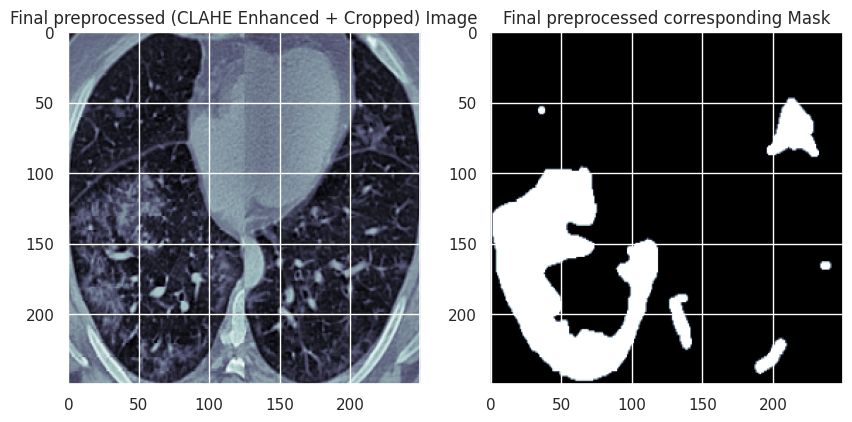

In [ ]:

x = 60

rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(cts[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")

plt.subplot(1, 2, 2)
plt.imshow(infections[x], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

print(cts[x].shape, infections[x].shape)

In [ ]:
no_masks = []
for i in range(0, len(infections)):
  if np.unique(infections[i]).size == 1:
    no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))

for index in sorted(no_masks, reverse = True):
    del infections[index]
    del cts[index]

Number of complete black masks : 498


Following is the demo for the CLAHE enhanced images with histograms.
Notice how the seahorse shaped infection in the left lung can be distinguised clearly after enhancement.

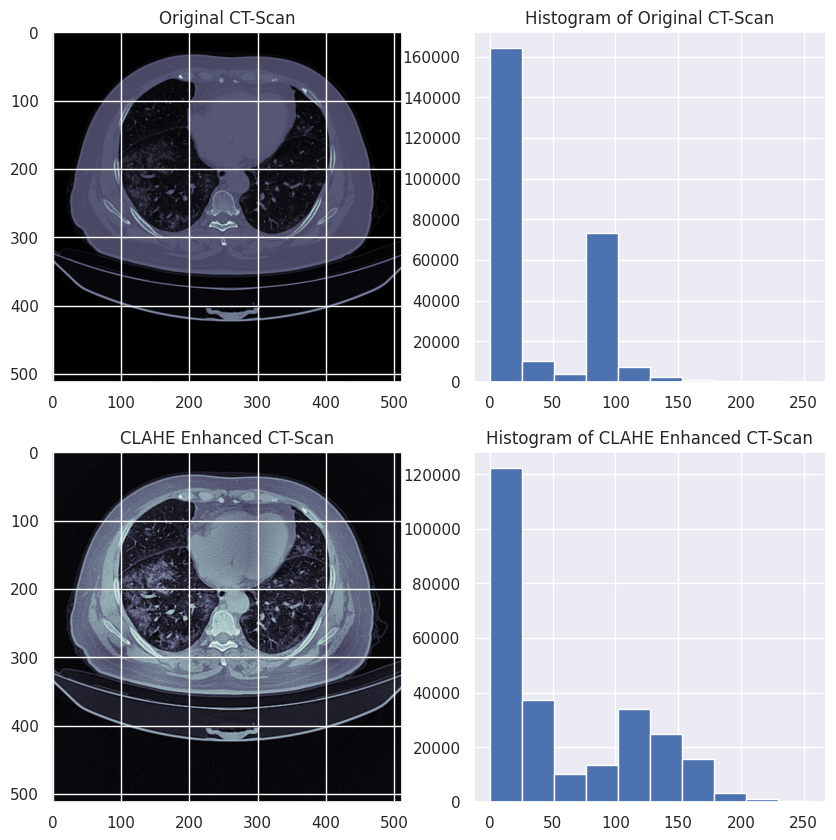

In [ ]:
test_file = []
read_nii_demo(raw_data.loc[0,'ct_scan'], test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[60], demo = 1)

Finally 1614 samples which will later be split into train and test

In [ ]:
print(len(cts) , len(infections))

1614 1614


In [ ]:
dim1=[]
dim2=[]
for i in range(0, len(cts)):
  dim1.append(cts[i].shape[0])
  dim2.append(cts[i].shape[1])
dim1 = np.array(dim1)
dim2 = np.array(dim2)

print("An idea about the new net dimension to which all must be resized to (some will increase and some decrease) --->", np.median(dim1),'x', np.median(dim2))

An idea about the new net dimension to which all must be resized to (some will increase and some decrease) ---> 250.0 x 250.0


In [ ]:
new_dim = 224

In [ ]:
for i in range(0,len(cts)):
  cts[i] = cv2.resize(cts[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # cts[i] = cts[i]/255
  infections[i] = cv2.resize(infections[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # infections[i] = infections[i]/255

In [ ]:
# for i in range(0, len(cts)):
#   cts[i] = cv2.cvtColor(cts[i], cv2.COLOR_GRAY2RGB)
# for i in range(0, len(infections)):
#   infections[i] = cv2.cvtColor(infections[i], cv2.COLOR_GRAY2RGB)

In [ ]:
cts = np.array(cts)
infections = np.array(infections)

Saving the numpy arrays to later reuse the same preprocessing for other models rather than doing it again and again.


In [ ]:
cts = np.uint8(cts)
infections = np.uint8(infections)

Data augmentation pipeline

In [ ]:
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Flipud(0.2), # vertically flip 20% of all images
    sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            rotate=(-40, 40), # rotate by -45 to +45 degrees
            shear=(-16, 16), # shear by -16 to +16 degrees
            # mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        ))
], random_order=True)

In [ ]:
no_of_aug_imgs = 200
random_indices = np.random.randint(0, cts.shape[0], size=no_of_aug_imgs)
sample_cts = cts[random_indices]
sample_inf = infections[random_indices]

In [ ]:
sample_cts = np.floor(sample_cts)
sample_inf = np.floor(sample_inf)
sample_cts = np.uint16(sample_cts)
sample_inf = np.uint16(sample_inf)

In [ ]:
sample_inf = np.expand_dims(sample_inf, axis=-1)
cts_aug, infections_aug = seq(images=sample_cts, segmentation_maps=sample_inf)

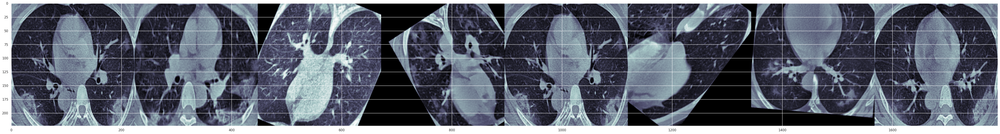

In [ ]:
rcParams['figure.figsize'] = 60,60
rand = np.random.randint(0, no_of_aug_imgs, size=8)

cells1 = cts_aug[rand]
grid_image1 = np.hstack(cells1)
plt.imshow(grid_image1, cmap = 'bone')

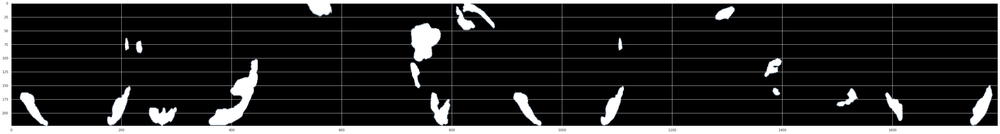

In [ ]:
cells2 = infections_aug[rand]
grid_image2 = np.hstack(cells2)
plt.imshow(grid_image2, cmap = 'bone')

In [ ]:
print(cts_aug.shape, infections_aug.shape)

(200, 224, 224) (200, 224, 224, 1)


In [ ]:
cts_aug = cts_aug/255
infections_aug = infections_aug/255
cts_aug = cts_aug.reshape(len(cts_aug), new_dim, new_dim, 1)
infections_aug = infections_aug.reshape(len(infections_aug), new_dim, new_dim, 1)

In [ ]:
# Normalizing images and masks from 0 to 1
joblib.dump(cts, 'cts_cropped_lungs_224.pkl')
files.download('cts_cropped_lungs_224.pkl')
joblib.dump(infections, 'infections_cropped_lungs_224.pkl')
files.download('infections_cropped_lungs_224.pkl')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
cts = joblib.load('/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans/cts_cropped_lungs_224.pkl')
infections = joblib.load('/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans/infections_cropped_lungs_224.pkl')
print(cts.shape, infections.shape)

(1614, 224, 224) (1614, 224, 224)


In [ ]:
cts = cts/255
infections = infections/255

In [ ]:
cts = cts.reshape(len(cts), new_dim, new_dim, 1)
infections = infections.reshape(len(infections), new_dim, new_dim, 1)

In [ ]:
# Just overlaying infection masks over the corresponding CT scans
def plot_sample(array_list, color_map = 'nipy_spectral'):
  '''
  Plots and a slice with all available annotations
  '''
  fig = plt.figure(figsize=(10,30))

  plt.subplot(1,2,1)
  plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
  plt.title('Original Image')

  # plt.subplot(1,2,2)
  # plt.imshow(array_list[0], cmap='bone')
  # plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
  # plt.title('Lung Mask')

  plt.subplot(1,2,2)
  plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
  plt.imshow(array_list[1].reshape(new_dim, new_dim), alpha=0.5, cmap=color_map)
  plt.title('Infection Mask')

  # plt.subplot(1,2,2)
  # plt.imshow(array_list[0].reshape(img_size,img_size), cmap='bone')
  # plt.imshow(array_list[1].reshape(img_size, img_size), alpha=0.5, cmap=color_map)
  # plt.title('Lung and Infection Mask')

# plt.subplot(1,4,4)
# plt.imshow(array_list[0], cmap='bone')
# plt.imshow(array_list[3], alpha=0.5, cmap=color_map)
# plt.title('Lung and Infection Mask')

  plt.show()

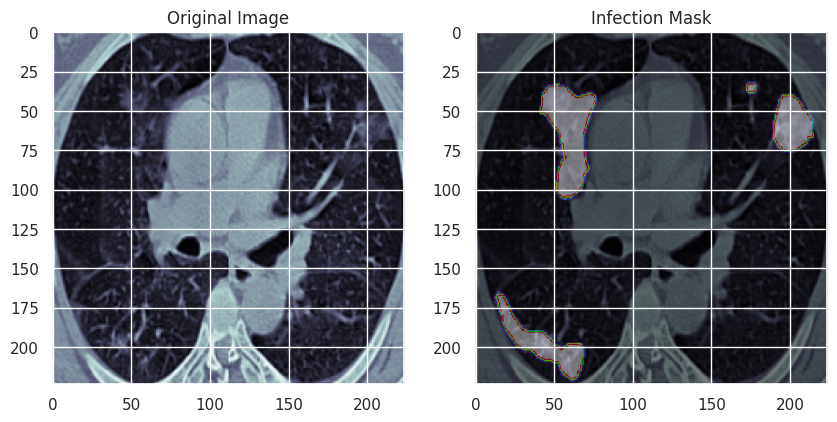

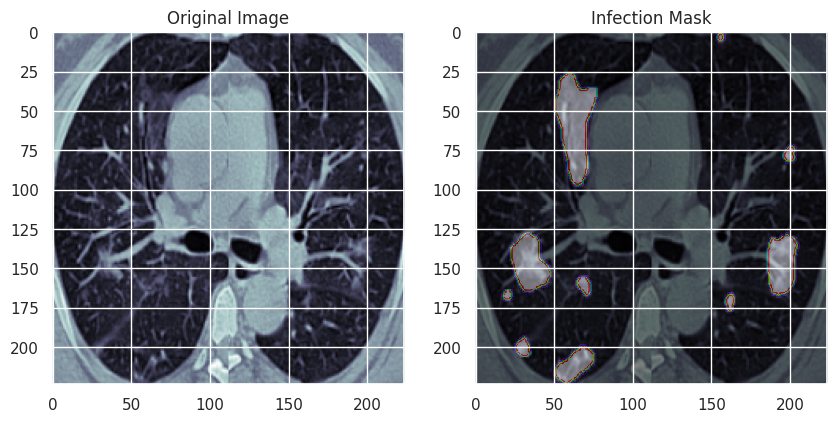

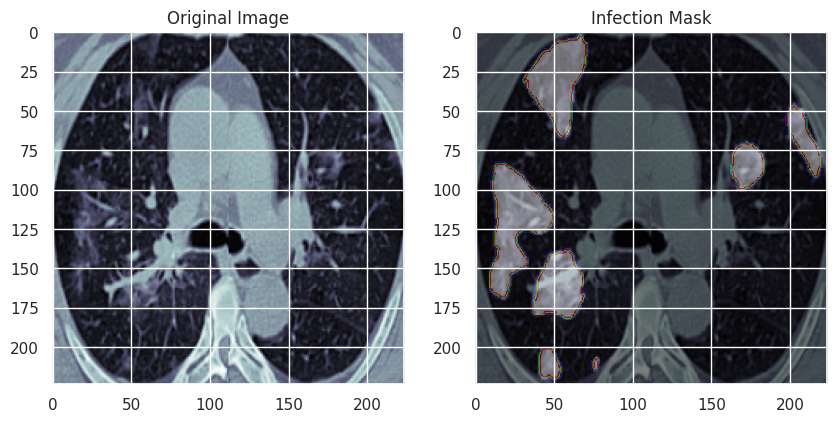

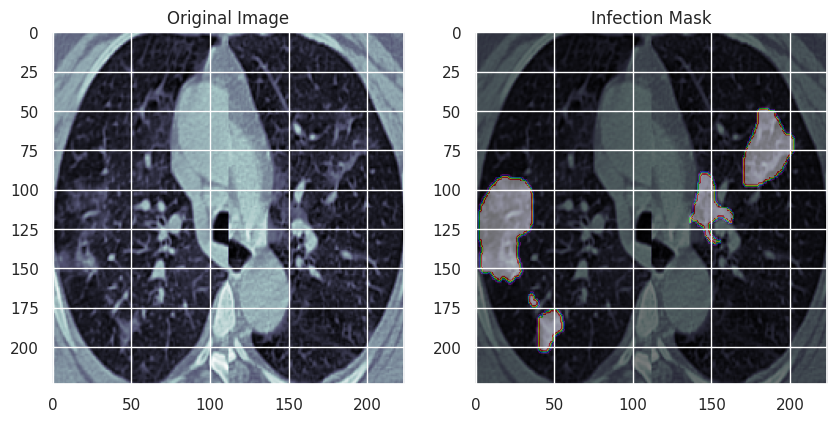

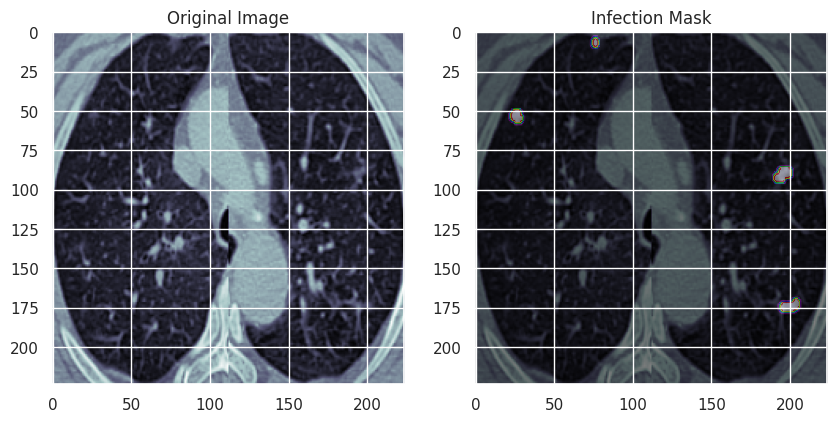

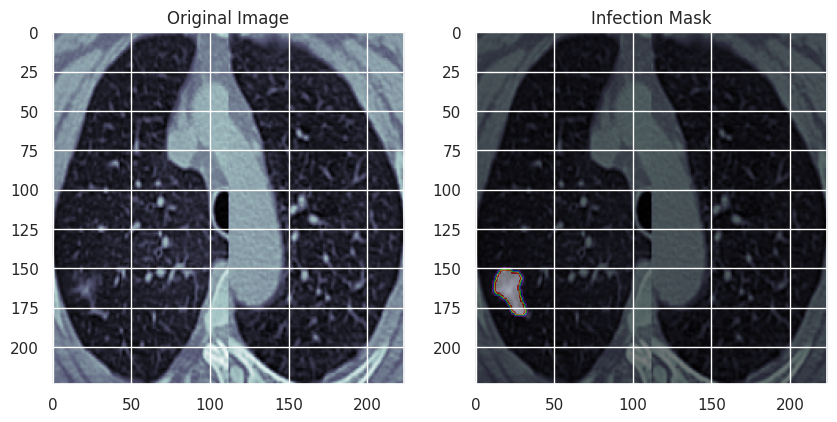

In [ ]:
for index in [100,110,120,130,140,150]:
	plot_sample([cts[index], infections[index]])

In [ ]:
def dice_coeff(y_true, y_pred):
  smooth = 1.
  y_true_f = tf.reshape(y_true, [-1])
  y_pred_f = tf.reshape(y_pred, [-1])
  intersection = tf.reduce_sum(y_true_f * y_pred_f)
  score = (2. * intersection + smooth) / (tf.reduce_sum(y_true_f) + tf.reduce_sum(y_pred_f) + smooth)
  return score

In [ ]:
def dice_loss(y_true, y_pred):
  loss = 1 - dice_coeff(y_true, y_pred)
  return loss

In [ ]:
def bce_dice_loss(y_true, y_pred):
  loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
  return loss

In [ ]:
def tversky_loss(y_true, y_pred):
  alpha = 0.5
  beta  = 0.5

  ones = K.ones(K.shape(y_true))
  p0 = y_pred      # proba that voxels are class i
  p1 = ones-y_pred # proba that voxels are not class i
  g0 = y_true
  g1 = ones-y_true

  num = K.sum(p0*g0, (0,1,2))
  den = num + alpha*K.sum(p0*g1,(0,1,2)) + beta*K.sum(p1*g0,(0,1,2))

  T = K.sum(num/den) # when summing over classes, T has dynamic range [0 Ncl]

  Ncl = K.cast(K.shape(y_true)[-1], 'float32')
  return Ncl-T

In [ ]:
def weighted_bce_loss(y_true, y_pred, weight):
  epsilon = 1e-7
  y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
  logit_y_pred = K.log(y_pred / (1. - y_pred))
  loss = weight * (logit_y_pred * (1. - y_true) +
                    K.log(1. + K.exp(-K.abs(logit_y_pred))) + K.maximum(-logit_y_pred, 0.))
  return K.sum(loss) / K.sum(weight)

In [ ]:
def weighted_dice_loss(y_true, y_pred, weight):
  smooth = 1.
  w, m1, m2 = weight, y_true, y_pred
  intersection = (m1 * m2)
  score = (2. * K.sum(w * intersection) + smooth) / (K.sum(w * m1) + K.sum(w * m2) + smooth)
  loss = 1. - K.sum(score)
  return loss

In [ ]:
def weighted_bce_dice_loss(y_true, y_pred):
  y_true = K.cast(y_true, 'float32')
  y_pred = K.cast(y_pred, 'float32')
  # if we want to get same size of output, kernel size must be odd
  averaged_mask = K.pool2d(
          y_true, pool_size=(50, 50), strides=(1, 1), padding='same', pool_mode='avg')
  weight = K.ones_like(averaged_mask)
  w0 = K.sum(weight)
  weight = 5. * K.exp(-5. * K.abs(averaged_mask - 0.5))
  w1 = K.sum(weight)
  weight *= (w0 / w1)
  loss = 0.5*weighted_bce_loss(y_true, y_pred, weight) + 0.5*dice_loss(y_true, y_pred)
  return loss

In [ ]:
class CosineAnnealingScheduler(Callback):
  def __init__(self, T_max, eta_max, eta_min=0, verbose=1):
      super(CosineAnnealingScheduler, self).__init__()
      self.T_max = T_max
      self.eta_max = eta_max
      self.eta_min = eta_min
      self.verbose = verbose

  def on_epoch_begin(self, epoch, logs=None):
      if not hasattr(self.model.optimizer, 'lr'):
          raise ValueError('Optimizer must have a "lr" attribute.')
      lr = self.eta_min + (self.eta_max - self.eta_min) * (1 + math.cos(math.pi * epoch / self.T_max)) / 2
      K.set_value(self.model.optimizer.lr, lr)
      print('\nEpoch %05d: CosineAnnealingScheduler setting learning ''rate to %s.' % (epoch + 1, lr))

  def on_epoch_end(self, epoch, logs=None):
      logs = logs or {}
      logs['lr'] = K.get_value(self.model.optimizer.lr)

In [ ]:
cosine_annealer = CosineAnnealingScheduler(T_max=7, eta_max=0.0005, eta_min=0.0001)

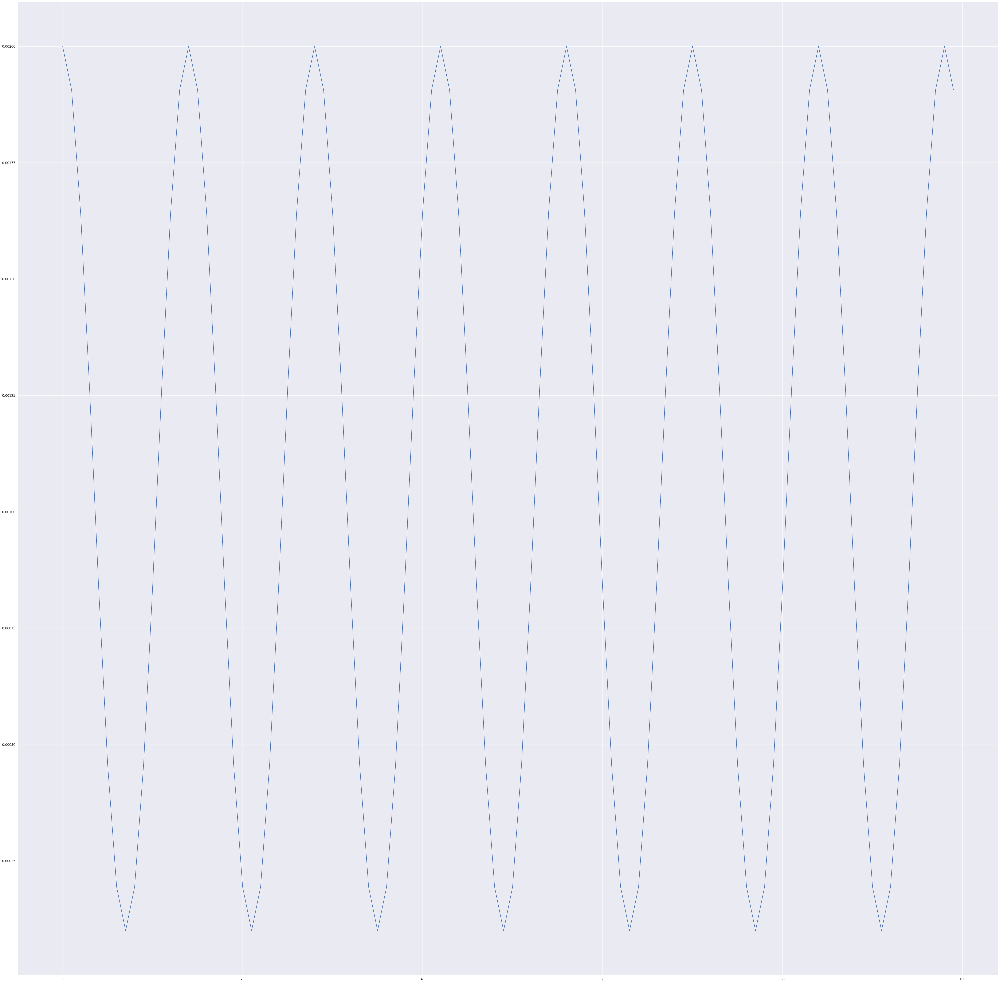

In [ ]:
plt.grid('True')
rcParams['figure.figsize'] = 5,5
T_max=7
eta_max=0.002
eta_min = 0.0001
lr=[]
for epoch in range(100):
    lr.append(eta_min + (eta_max - eta_min) * (1 + math.cos(math.pi * epoch / T_max)) / 2)
lr = np.array(lr)
plt.plot(lr)

In [ ]:
inputs = Input((new_dim, new_dim, 1))

In [ ]:
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (inputs)
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c1)
c1 = BatchNormalization()(c1)
p1 = MaxPooling2D((2, 2)) (c1)
p1 = Dropout(0.25)(p1)

c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p1)
c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c2)
c2 = BatchNormalization()(c2)
p2 = MaxPooling2D((2, 2)) (c2)
p2 = Dropout(0.25)(p2)

c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p2)
c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c3)
c3 = BatchNormalization()(c3)
p3 = MaxPooling2D((2, 2)) (c3)
p3 = Dropout(0.25)(p3)

c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p3)
c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c4)
c4 = BatchNormalization()(c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
p4 = Dropout(0.25)(p4)

c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p4)
c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c5)

u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = concatenate([u6, c4])
u6 = BatchNormalization()(u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c6)


u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
u7 = BatchNormalization()(u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c7)


u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
u8 = BatchNormalization()(u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c8)


u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
u9 = BatchNormalization()(u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs])
model.summary()

Model: "functional_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_16            │ (None, 224, 224, 1)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_34 (Conv2D)        │ (None, 224, 224, 32)   │            320 │ input_layer_16[0][0]   │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_35 (Conv2D)        │ (None, 224, 224, 32)   │          9,248 │ conv2d_34[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_30    │ (None, 224, 224, 32)   │            128 │ conv2d_35[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_4           │ (None, 112, 112, 32)   │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout (Dropout)         │ (None, 112, 112, 32)   │              0 │ max_pooling2d_4[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_36 (Conv2D)        │ (None, 112, 112, 64)   │         18,496 │ dropout[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_37 (Conv2D)        │ (None, 112, 112, 64)   │         36,928 │ conv2d_36[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_31    │ (None, 112, 112, 64)   │            256 │ conv2d_37[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_5           │ (None, 56, 56, 64)     │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_1 (Dropout)       │ (None, 56, 56, 64)     │              0 │ max_pooling2d_5[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_38 (Conv2D)        │ (None, 56, 56, 128)    │         73,856 │ dropout_1[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_39 (Conv2D)        │ (None, 56, 56, 128)    │        147,584 │ conv2d_38[0][0]        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_32    │ (None, 56, 56, 128)    │            512 │ conv2d_39[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ max_pooling2d_6           │ (None, 28, 28, 128)    │              0 │ batch_normalization_3… │
│ (MaxPooling2D)            │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dropout_2 (Dropout)       │ (None, 28, 28, 128)    │              0 │ max_pooling2d_6[0][0]  │
├──────────────────────

 Total params: 7,765,281 (29.62 MB)

 Trainable params: 7,762,401 (29.61 MB)

 Non-trainable params: 2,880 (11.25 KB)

In [ ]:
batch_size = 32
epochs = 80
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff_1="unet_covid_fold1.keras"
filepath_dice_coeff_2="unet_covid_fold2.keras"
filepath_dice_coeff_3="unet_covid_fold3.keras"

checkpoint_dice_1 = ModelCheckpoint(filepath_dice_coeff_1, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_dice_2 = ModelCheckpoint(filepath_dice_coeff_2, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_dice_3 = ModelCheckpoint(filepath_dice_coeff_3, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
# checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [ ]:
import timeit
from sklearn.model_selection import KFold # import KFold

start = timeit.default_timer()

kf = KFold(n_splits=3, random_state=42, shuffle=True)

fold_number = 1

for train_index, test_index in kf.split(cts):

  print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
  print("Current fold number going:", fold_number)
  print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")

  x_train, x_valid = cts[train_index], cts[test_index]
  y_train, y_valid = infections[train_index], infections[test_index]
  print("Shapes:", x_train.shape, x_valid.shape)

  if fold_number == 1:
    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])

    results_1 = model.fit(x_train, y_train, batch_size=batch_size, epochs=80,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice_1])

  if fold_number == 2:
    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])

    results_2 = model.fit(x_train, y_train, batch_size=batch_size, epochs=20,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice_2])

  if fold_number == 3:
    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])

    results_3 = model.fit(x_train, y_train, batch_size=batch_size, epochs=20,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice_3])


  fold_number = fold_number + 1


stop = timeit.default_timer()

%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Current fold number going: 1
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Shapes: (1076, 224, 224, 1) (538, 224, 224, 1)
Epoch 1/80
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - dice_coeff: 0.1654 - loss: 0.6192   
Epoch 1: val_dice_coeff improved from -inf to 0.13086, saving model to unet_covid_fold1.keras
34/34 ━━━━━━━━━━━━━━━━━━━━ 166s 3s/step - dice_coeff: 0.1680 - loss: 0.6159 - val_dice_coeff: 0.1309 - val_loss: 0.7625
Epoch 2/80
34/34 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step - dice_coeff: 0.5675 - loss: 0.2997
Epoch 2: val_dice_coeff did not improve from 0.13086
34/34 ━━━━━━━━━━━━━━━━━━━━ 19s 548ms/step - dice_coeff: 0.5685 - loss: 0.2991 - val_dice_coeff: 0.0318 - val_loss: 0.64

In [ ]:
print('Time of 3-fold cross validation: ', stop - start)

In [ ]:
model.save_weights(filepath_dice_coeff_1 + ".weights.h5")
model.save_weights(filepath_dice_coeff_2 + ".weights.h5")
model.save_weights(filepath_dice_coeff_3 + ".weights.h5")

In [ ]:
files.download(filepath_dice_coeff_1)
files.download(filepath_dice_coeff_2)
files.download(filepath_dice_coeff_3)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
gc.collect()

In [ ]:
kf.get_n_splits(cts)

3

In [ ]:
paths = [filepath_dice_coeff_1, filepath_dice_coeff_2, filepath_dice_coeff_3]
split_number = 1
for train_index, test_index in kf.split(cts):
  print("......................................................................................................................")
  print("Current split number going:", split_number)
  print("......................................................................................................................")
  x_train, x_valid = cts[train_index], cts[test_index]
  y_train, y_valid = infections[train_index], infections[test_index]
  model.load_weights(paths[split_number-1])
  score = model.evaluate(x_valid, y_valid, batch_size=32)
  print("test loss, test dice coefficient:", score)
  split_number = split_number + 1

......................................................................................................................
Current split number going: 1
......................................................................................................................
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 119ms/step - dice_coeff: 0.8683 - loss: 0.1020
test loss, test dice coefficient: [0.10433832556009293, 0.871783971786499]
......................................................................................................................
Current split number going: 2
......................................................................................................................
17/17 ━━━━━━━━━━━━━━━━━━━━ 2s 121ms/step - dice_coeff: 0.9311 - loss: 0.0446
test loss, test dice coefficient: [0.04361719265580177, 0.9345731139183044]
......................................................................................................................
Current split number going: 3
..........

In [ ]:
split_number = 1
the_range = np.arange(0.30,0.80, 0.05)
print(len(the_range))

total_dices=[]
total_ious=[]
total_precisions=[]
total_recalls=[]

for train_index, test_index in kf.split(cts):
  dices_per_threshold = []
  ious_per_threshold = []
  precisions_per_threshold = []
  recalls_per_threshold = []

  print(".................................................................................................................................................")
  print("Current split number going:", split_number)
  print(".................................................................................................................................................")
  x_train, x_valid = cts[train_index], cts[test_index]
  y_train, y_valid = infections[train_index], infections[test_index]
  model.load_weights(paths[split_number-1])

  for t in the_range:

    print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")
    print("Calculating for threshold:", t)
    print("%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%")

    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[sm.metrics.FScore(threshold=t)])
    dices_per_threshold.append(model.evaluate(x_valid, y_valid, batch_size=32)[1])

    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[sm.metrics.IOUScore(threshold=t)])
    ious_per_threshold.append(model.evaluate(x_valid, y_valid, batch_size=32)[1])

    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[sm.metrics.Precision(threshold=t)])
    precisions_per_threshold.append(model.evaluate(x_valid, y_valid, batch_size=32)[1])

    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[sm.metrics.Recall(threshold=t)])
    recalls_per_threshold.append(model.evaluate(x_valid, y_valid, batch_size=32)[1])

  total_dices.append(dices_per_threshold)
  total_ious.append(ious_per_threshold)
  total_precisions.append(precisions_per_threshold)
  total_recalls.append(recalls_per_threshold)

  split_number = split_number + 1


10
.................................................................................................................................................
Current split number going: 1
.................................................................................................................................................
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Calculating for threshold: 0.3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - f1-score: 0.8716 - loss: 0.1020
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 183ms/step - iou_score: 0.7733 - loss: 0.1020
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 206ms/step - loss: 0.1020 - precision: 0.8539
17/17 ━━━━━━━━━━━━━━━━━━━━ 7s 178ms/step - loss: 0.1020 - recall: 0.8902
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Calculating for threshold: 0.35
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
17/17 ━━━━━━━━━━

/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 126 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Calculating for threshold: 0.3
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 164ms/step - f1-score: 0.9376 - loss: 0.0446
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 194ms/step - iou_score: 0.8827 - loss: 0.0446
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - loss: 0.0446 - precision: 0.9220
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 186ms/step - loss: 0.0446 - recall: 0.9538
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
Calculating for threshold: 0.35
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 168ms/step - f1-score: 0.9380 - loss: 0.0446
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 171ms/step - iou_score: 0.8835 - loss: 0.0446
17/17 ━━━━━━━━━━━━━━━━━━━━ 5s 195ms/step - loss: 0.0446 - precision: 0.9259
17/17 ━━━━━━━━━━━━━━━━━━━━ 4s 167ms/step - loss: 0.0446 - recall: 0.9506
%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

In [ ]:
total_dices = np.array(total_dices)
total_dices = np.transpose(total_dices)
df_dices = pd.DataFrame(data=total_dices, index = the_range, columns = [1,2,3])
print("3-fold Dices dataframe")
print("Rows indices: Thresholds, Column indices: Split Number")
df_dices

3-fold Dices dataframe
Rows indices: Thresholds, Column indices: Split Number


,1,2,3
0.30,0.875053,0.940523,0.947754
0.35,0.875288,0.940996,0.948281
0.40,0.875478,0.941341,0.948570
0.45,0.875515,0.941516,0.948724
0.50,0.875534,0.941603,0.948825
0.55,0.875421,0.941577,0.948814
0.60,0.875309,0.941498,0.948691
0.65,0.875067,0.941221,0.948477
0.70,0.874795,0.940795,0.948043
0.75,0.874385,0.940098,0.947347


In [ ]:
print("Maximum validation dice on any splits:", np.max(total_dices))
print("Maximum validation dice on each of the 3 splits (any threshold chosen):", np.array(df_dices.max(axis=0)))
print("Best threshold for each split", the_range[df_dices[1].argmax()], the_range[df_dices[2].argmax()], the_range[df_dices[3].argmax()])
print("Mean of all obtained dices:", df_dices.mean().mean())

Maximum validation dice on any splits: 0.9488247036933899
Maximum validation dice on each of the 3 splits (any threshold chosen): [0.8755337  0.94160348 0.9488247 ]
Best threshold for each split 0.49999999999999994 0.49999999999999994 0.49999999999999994
Mean of all obtained dices: 0.9215513586997984


In [ ]:
total_ious = np.array(total_ious)
total_ious = np.transpose(total_ious)
df_ious = pd.DataFrame(data=total_ious, index = the_range, columns = [1,2,3])
print("3-fold Ious dataframe")
print("Rows indices: Thresholds, Column indices: Split Number")
df_ious

3-fold Ious dataframe
Rows indices: Thresholds, Column indices: Split Number


,1,2,3
0.30,0.778945,0.887908,0.900966
0.35,0.779327,0.888752,0.901911
0.40,0.779637,0.889369,0.902432
0.45,0.779707,0.889684,0.902709
0.50,0.779745,0.889842,0.902884
0.55,0.779578,0.889800,0.902863
0.60,0.779414,0.889662,0.902636
0.65,0.779041,0.889174,0.902247
0.70,0.778627,0.888422,0.901463
0.75,0.777992,0.887192,0.900209


In [ ]:
print("Maximum validation iou on any splits:", np.max(total_ious))
print("Maximum validation iou on each of the 3 splits (any threshold chosen):", np.array(df_ious.max(axis=0)))
print("Best threshold for each split", the_range[df_ious[1].argmax()], the_range[df_ious[2].argmax()], the_range[df_ious[3].argmax()])
print("Mean of all obtained ious:", df_ious.mean().mean())

Maximum validation iou on any splits: 0.9028837084770203
Maximum validation iou on each of the 3 splits (any threshold chosen): [0.77974516 0.88984245 0.90288371]
Best threshold for each split 0.49999999999999994 0.49999999999999994 0.49999999999999994
Mean of all obtained ious: 0.8567379474639892


In [ ]:
total_precisions = np.array(total_precisions)
total_precisions = np.transpose(total_precisions)
df_precision = pd.DataFrame(data=total_precisions, index = the_range, columns = [1,2,3])
print("3-fold precision dataframe")
print("Rows indices: Thresholds, Column indices: Split Number")
df_precision

3-fold precision dataframe
Rows indices: Thresholds, Column indices: Split Number


,1,2,3
0.30,0.857719,0.925495,0.932961
0.35,0.860997,0.929189,0.936538
0.40,0.864000,0.932502,0.939630
0.45,0.866727,0.935514,0.942485
0.50,0.869440,0.938356,0.945178
0.55,0.872105,0.941120,0.947833
0.60,0.874726,0.943875,0.950455
0.65,0.877525,0.946703,0.953190
0.70,0.880588,0.949711,0.956093
0.75,0.884054,0.952997,0.959280


In [ ]:
print("Maximum validation precision on any splits:", np.max(total_precisions))
print("Maximum validation precision on each of the 3 splits (any threshold chosen):", np.array(df_precision.max(axis=0)))
print("Best threshold for each split", the_range[df_precision[1].argmax()], the_range[df_precision[2].argmax()], the_range[df_precision[3].argmax()])
print("Mean of all obtained precisions:", df_precision.mean().mean())

Maximum validation precision on any splits: 0.9592798948287964
Maximum validation precision on each of the 3 splits (any threshold chosen): [0.88405436 0.95299733 0.95927989]
Best threshold for each split 0.7499999999999999 0.7499999999999999 0.7499999999999999
Mean of all obtained precisions: 0.9188995758692423


In [ ]:
total_recalls = np.array(total_recalls)
total_recalls = np.transpose(total_recalls)
df_recall = pd.DataFrame(data=total_recalls, index = the_range, columns = [1,2,3])
print("3-fold precision dataframe")
print("Rows indices: Thresholds, Column indices: Split Number")
df_recall

3-fold precision dataframe
Rows indices: Thresholds, Column indices: Split Number


,1,2,3
0.30,0.893370,0.956134,0.963107
0.35,0.890334,0.953194,0.960389
0.40,0.887545,0.950438,0.957736
0.45,0.884771,0.947685,0.955090
0.50,0.882008,0.944965,0.952536
0.55,0.879066,0.942131,0.949829
0.60,0.876204,0.939235,0.946961
0.65,0.872945,0.935910,0.943836
0.70,0.869413,0.932162,0.940151
0.75,0.865280,0.927676,0.935736


In [ ]:
print("Maximum validation recall on any splits:", np.max(total_recalls))
print("Maximum validation recall on each of the 3 splits (any threshold chosen):", np.array(df_recall.max(axis=0)))
print("Best threshold for each split", the_range[df_recall[1].argmax()], the_range[df_recall[2].argmax()], the_range[df_recall[3].argmax()])
print("Mean of all obtained recalls:", df_recall.mean().mean())

Maximum validation recall on any splits: 0.963107168674469
Maximum validation recall on each of the 3 splits (any threshold chosen): [0.89336962 0.95613426 0.96310717]
Best threshold for each split 0.3 0.3 0.3
Mean of all obtained recalls: 0.924527907371521


In [ ]:
plt.rcParams.update({'font.size': 22})
def compare_actual_and_predicted(image_no):

    fig = plt.figure(figsize=(50,50))

    plt.subplot(1,5,1)
    plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,5,2)
    plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,5,3)
    model.load_weights('/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans/unet_covid_fold1.keras')
    temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Model 1 output')

    plt.subplot(1,5,4)
    model.load_weights('/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans/unet_covid_fold2.keras')
    temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Model 2 output')

    plt.subplot(1,5,5)
    model.load_weights('/content/drive/MyDrive/covid_ct_scan/covid19-ct-scans/unet_covid_fold3.keras')
    temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Model 3 output')

    plt.show()

# plt.imshow(temp.reshape(img_size, img_size), cmap = 'bone')
# plt.imshow(infections_scaled[120].reshape(img_size, img_size), cmap ='summer')


/usr/local/lib/python3.10/dist-packages/keras/src/saving/saving_lib.py:576: UserWarning: Skipping variable loading for optimizer 'adam', because it has 2 variables whereas the saved optimizer has 126 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


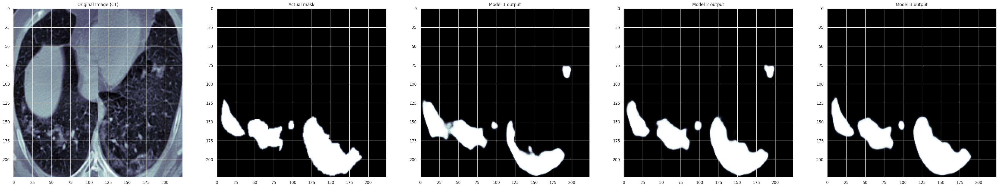

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


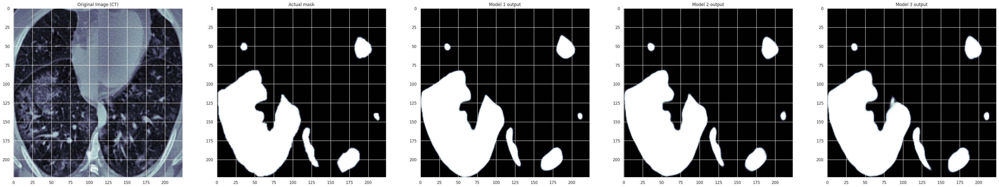

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step


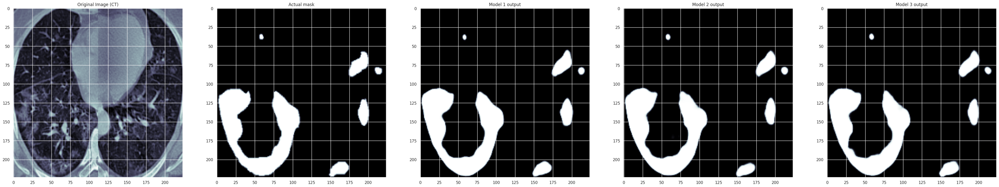

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


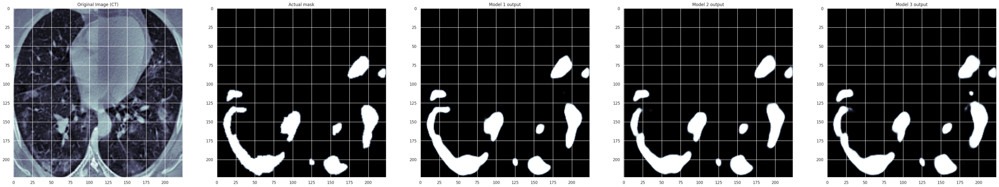

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


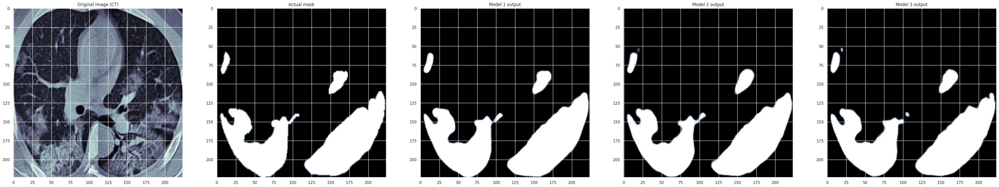

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


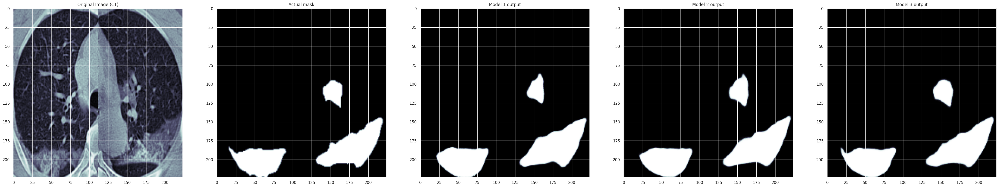

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


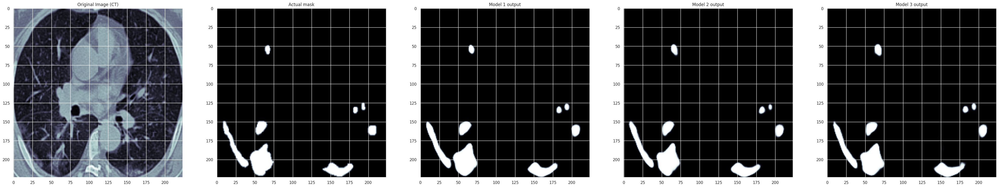

In [ ]:
for i in [30,40,50,55, 355, 380, 90]:
  compare_actual_and_predicted(i)


In [ ]:
gc.collect()

173206